<a href="https://colab.research.google.com/github/arizonaCameraLab/computationalImaging/blob/master/Chapter9DigitalImaging/keyPointsAndHomography.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Keypoints, keypoint matching, homography and warping
## David Brady
## University of Arizona
## Spring 2023

This notebook illustrates keypoint identification and matching in image pairs. We also illustrate the use of keypoint pairs to determine homography between images and the use of homography to warp images to common viewpoint.

### load libraries and images

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from skimage import data, filters
from scipy import ndimage
from google.colab import files

%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})

In [2]:
!wget --no-check-certificate --content-disposition 'https://github.com/ArizonaCameraLab/computationalImaging/raw/master/images/keypoints.npz'
!wget --no-check-certificate --content-disposition 'https://github.com/ArizonaCameraLab/computationalImaging/raw/master/images/peacock.npz'
data=np.load('keypoints.npz')
pdata=np.load('peacock.npz')
gray=data['arr_0']
gray2=data['arr_1']
p1=pdata['arr_0']
p2=pdata['arr_1']

--2025-03-26 20:28:23--  https://github.com/ArizonaCameraLab/computationalImaging/raw/master/images/keypoints.npz
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ArizonaCameraLab/computationalImaging/master/images/keypoints.npz [following]
--2025-03-26 20:28:24--  https://raw.githubusercontent.com/ArizonaCameraLab/computationalImaging/master/images/keypoints.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24000506 (23M) [application/octet-stream]
Saving to: ‘keypoints.npz’

keypoints.npz       100%[===================>]  22.89M  56.9MB/s    in 0.4s    

2025-03-26 20:28:25 (56.9 MB/s) - ‘key

## Example image

(np.float64(-0.5), np.float64(3999.5), np.float64(2999.5), np.float64(-0.5))

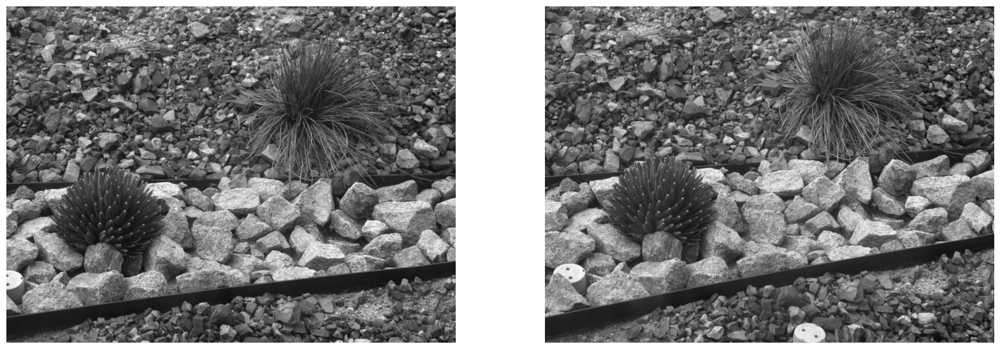

In [3]:
plt.subplot(1,2,1)
plt.imshow(gray, cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(gray2, cmap='gray')
plt.axis('off')

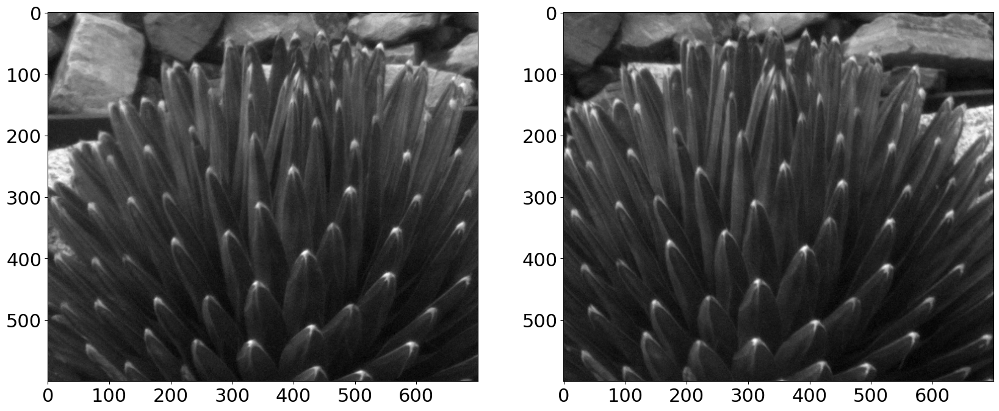

In [4]:
plt.subplot(1,2,1)
plt.imshow(gray[1400:2000,500:1200],cmap='gray')
plt.subplot(1,2,2)
plt.imshow(gray2[1300:1900,700:1400],cmap='gray')

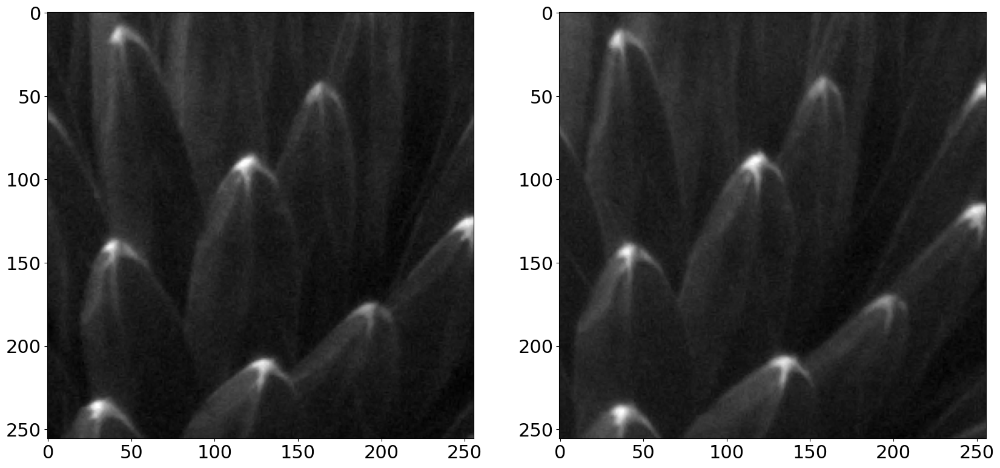

In [5]:
plt.figure(figsize=(20,40))
plt.subplot(1,2,1)
plt.imshow(gray[1700:1956,800:1056],cmap='gray')
plt.subplot(1,2,2)
plt.imshow(gray2[1594:1850,975:1231],cmap='gray')

## Keypoint detection and descriptors

The FAST keypoint detection algorithm identifies keypoints based on the number points in a circle around a given point that are less than the point's signal value. The actual FAST algorithm uses the "Harris corner detection" algorithm to evaluate the quality of keypoints, we implement a simplified version here. We identify a point as a keypoint if 12 of the 16 points on a surrounding circle are less than the value of the point minus a threshold. We keep a vector of the surrounding point values as a *keypoint descriptor*

In [6]:
def fast_keypoint_detector(image, threshold):
    # Step 1: Create a list of possible corner locations
    corners = []
    descriptors=[]
    for i in range(3, image.shape[0]-3):
        for j in range(3, image.shape[1]-3):
            if is_corner(image, i, j, threshold)[0]:
                corners.append((i, j))
                descriptors.append(is_corner(image, i, j, threshold)[1])
    return corners, descriptors

def is_corner(image, i, j, threshold):
    # Step 2: Check if the pixel at (i, j) is brighter or darker than its surrounding pixels
    pixel_value = image[i, j]
    descriptor=np.zeros(16)
    #if pixel_value < threshold or pixel_value > 255-threshold:
    #    return False
    pk=0
    for k in range(16):
        angle = k * np.pi / 8
        x = int(round(i + 3*np.cos(angle)))
        y = int(round(j + 3*np.sin(angle)))
        descriptor[k]=image[x, y]
        if image[x, y] < (pixel_value - threshold):
            pk=pk+1
    if pk>12:
        return True, descriptor/np.linalg.norm(descriptor)
    return False, []

def keypointMask(image, corners):
    oimage=np.stack((image,image,image),axis=-1)
    for k in corners:
        oimage[(k[0]-3):(k[0]+3),(k[1]-3):(k[1]+3),0]=255
    return oimage

The diameter of the surrounding circle may vary. For the algorithm implemented here, the figure below shows the 16 evaluation points in yellow.

3 0
3 1
2 2
1 3
0 3
-1 3
-2 2
-3 1
-3 0
-3 -1
-2 -2
-1 -3
0 -3
1 -3
2 -2
3 -1


(np.float64(-0.5), np.float64(10.5), np.float64(10.5), np.float64(-0.5))

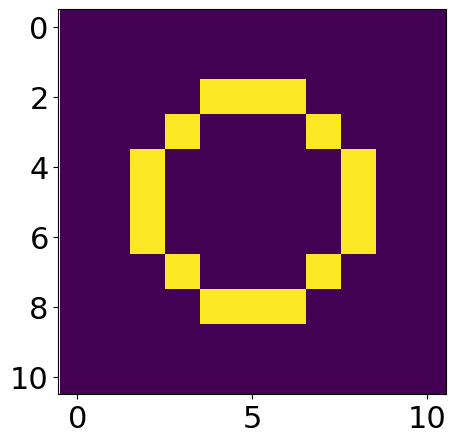

In [7]:
pip=np.zeros((11,11))
for k in range(16):
    angle = k * np.pi / 8
    x = int(round( 3* np.cos(angle)))
    y = int(round(3* np.sin(angle)))
    print(x,y)
    pip[x+5,y+5]=1
plt.figure(figsize=(5,5))
plt.imshow(pip)
plt.axis('equal')

## Example Keypoints

In [8]:
corners1, des1=fast_keypoint_detector(gray[1700:1956,800:1056],20)
corners2, des2=fast_keypoint_detector(gray2[1594:1850,975:1231],20)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

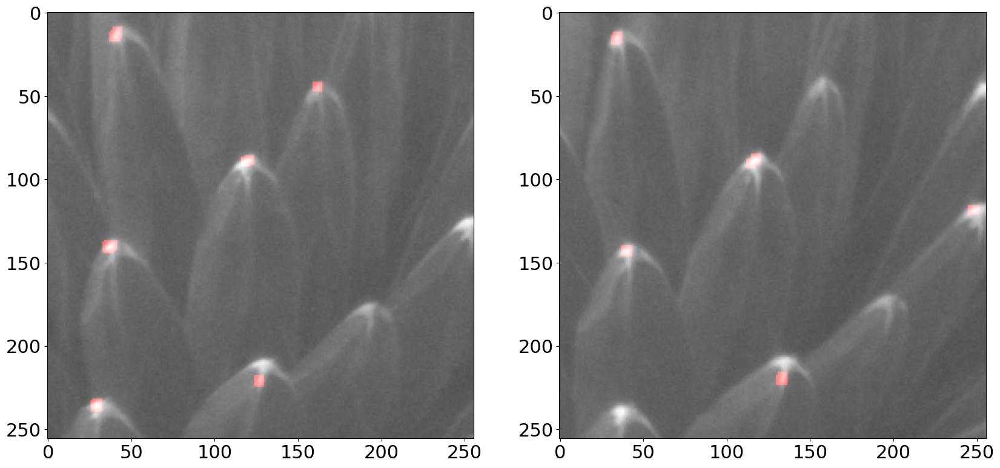

In [9]:
plt.subplot(1,2,1)
plt.imshow(keypointMask(gray[1700:1956,800:1056],corners1))
plt.subplot(1,2,2)
plt.imshow(keypointMask(gray2[1594:1850,975:1231],corners2))
plt.savefig('plantPoints.pdf')
#files.download('plantPoints.pdf')

In [10]:
corners1

[(12, 42),
 (13, 42),
 (14, 41),
 (15, 40),
 (15, 41),
 (45, 162),
 (89, 121),
 (90, 119),
 (140, 37),
 (140, 38),
 (140, 39),
 (141, 36),
 (141, 37),
 (141, 38),
 (142, 37),
 (221, 127),
 (222, 127),
 (235, 30),
 (236, 29),
 (236, 30),
 (237, 29),
 (237, 30)]

Let's look in detail at corner number 6 in the first image, at point 45, 162 in the cropped region. We can highlight the pixels used to evaluate this point

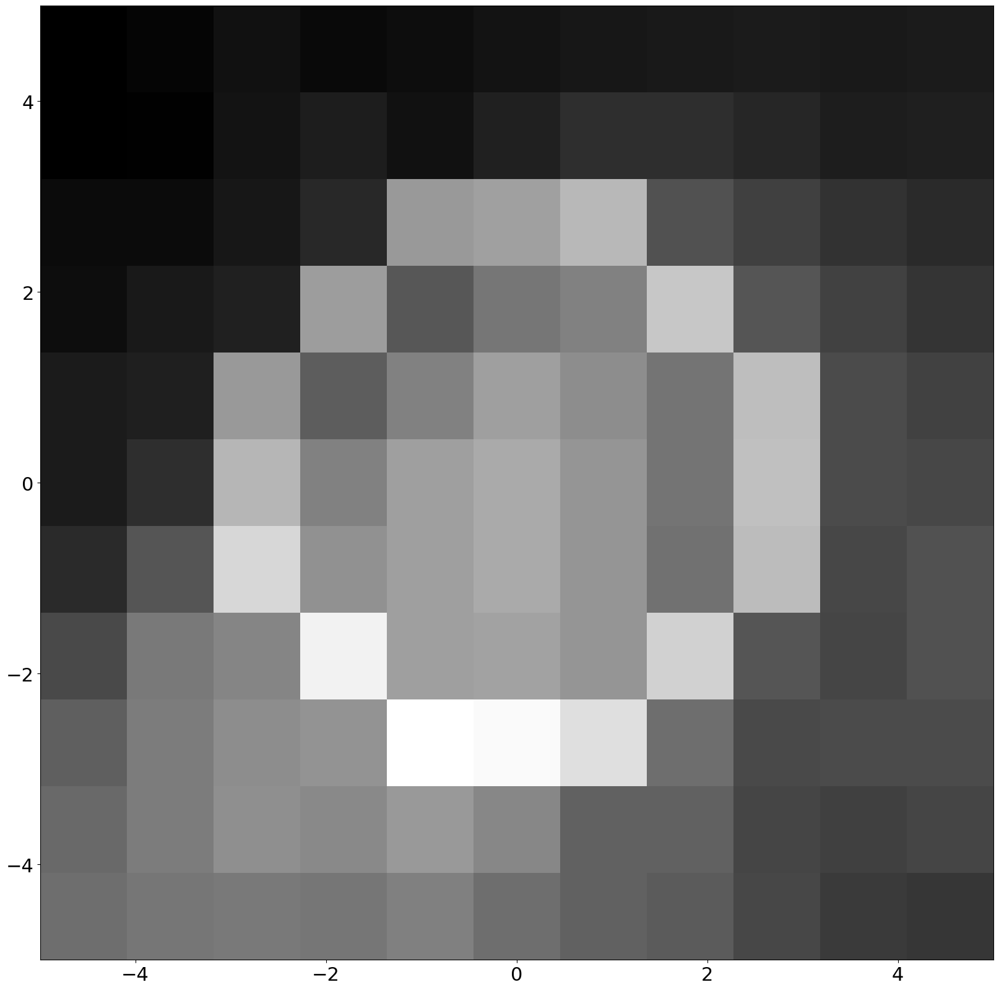

In [11]:
plt.imshow(gray[1740:1751,957:968]+50.*pip, cmap='gray', extent=[-5,5,-5,5])
plt.savefig('keypointCircle.pdf')
#files.download('keypointCircle.pdf')

as shown below, for threshold value 2, 14 of the 16 surrounding pixels have lower value than the keypoint.

In [12]:
for k in range(16):
  angle = k * np.pi / 8
  x = int(round(1745 + 3*np.cos(angle)))
  y = int(round(962 + 3*np.sin(angle)))
  print(gray[x, y])

181
167
160
149
151
150
155
147
135
131
133
131
146
163
177
184


## Keypoint matching

We may identify keypoints as belonging to the same feature by matching keypoint descriptors. ORB, SIFT and SURF use invariances in the features to enable keypoint matching when images are rotated and rescaled. Here we consider a simple distance metric between the vector of surrounding points for each keypoint. I the current example, 22 keypoints were identified in the first image and 16 in the second. The matrix below shows the distance between each pair of keypoints. Two points may be identified as matching if their mutual distance is minimal between all pairs.

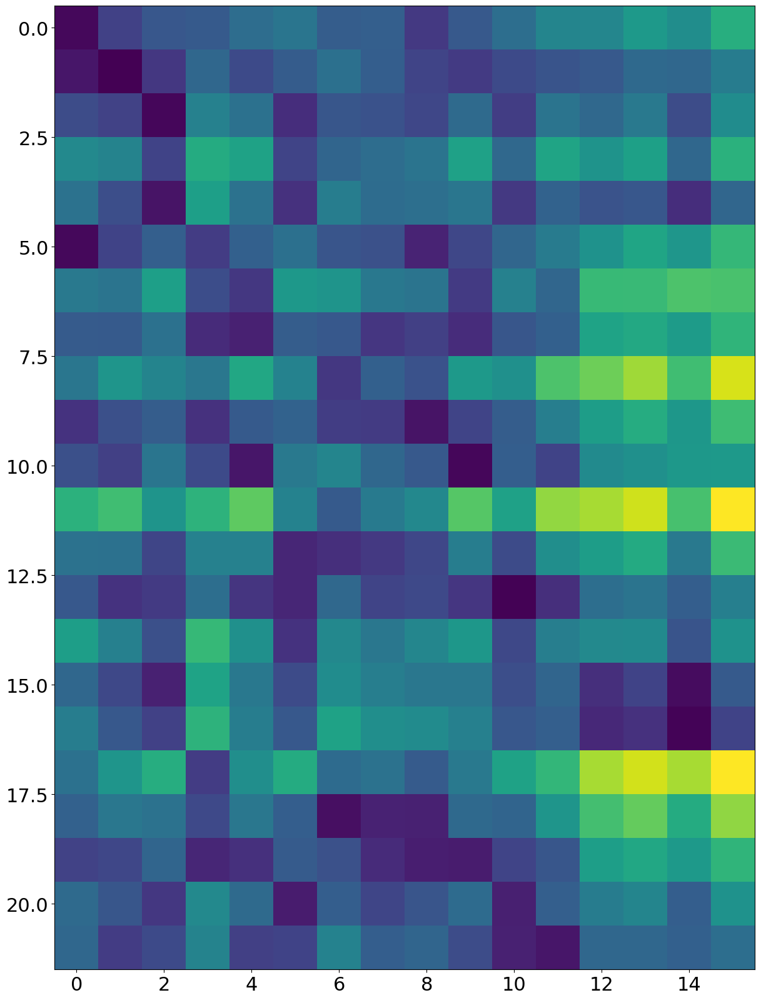

In [13]:
dist=np.zeros((len(des1),len(des2)))
i=0
for pip in des1:
  j=0
  for pop in des2:
    dist[i,j]=np.linalg.norm(pip-pop)
    j=j+1
  i=i+1
plt.imshow(dist)

In [14]:
matches=np.argmin(dist,axis=0)

The two images in this case are already roughly aligned. One imagines that the matches are good if the keypoint positions are similar. As shown in the table below, this is the case for most pairs, but a few are erroneously matched.

In [15]:
for dog in range(len(des2)):
  print('point ',corners2[dog], ' in image 2 matches point ',corners1[matches[dog]], ' in image 1 ')


point  (15, 35)  in image 2 matches point  (12, 42)  in image 1 
point  (16, 35)  in image 2 matches point  (13, 42)  in image 1 
point  (17, 34)  in image 2 matches point  (14, 41)  in image 1 
point  (88, 118)  in image 2 matches point  (236, 30)  in image 1 
point  (89, 118)  in image 2 matches point  (140, 39)  in image 1 
point  (91, 115)  in image 2 matches point  (237, 29)  in image 1 
point  (119, 248)  in image 2 matches point  (236, 29)  in image 1 
point  (119, 249)  in image 2 matches point  (236, 29)  in image 1 
point  (143, 40)  in image 2 matches point  (140, 38)  in image 1 
point  (143, 41)  in image 2 matches point  (140, 39)  in image 1 
point  (144, 40)  in image 2 matches point  (141, 38)  in image 1 
point  (144, 41)  in image 2 matches point  (237, 30)  in image 1 
point  (219, 134)  in image 2 matches point  (222, 127)  in image 1 
point  (220, 134)  in image 2 matches point  (222, 127)  in image 1 
point  (221, 133)  in image 2 matches point  (222, 127)  in im

## ORB and SIFT keypoint functions

Advanced keypoint matching capabilites are built into OpenCV

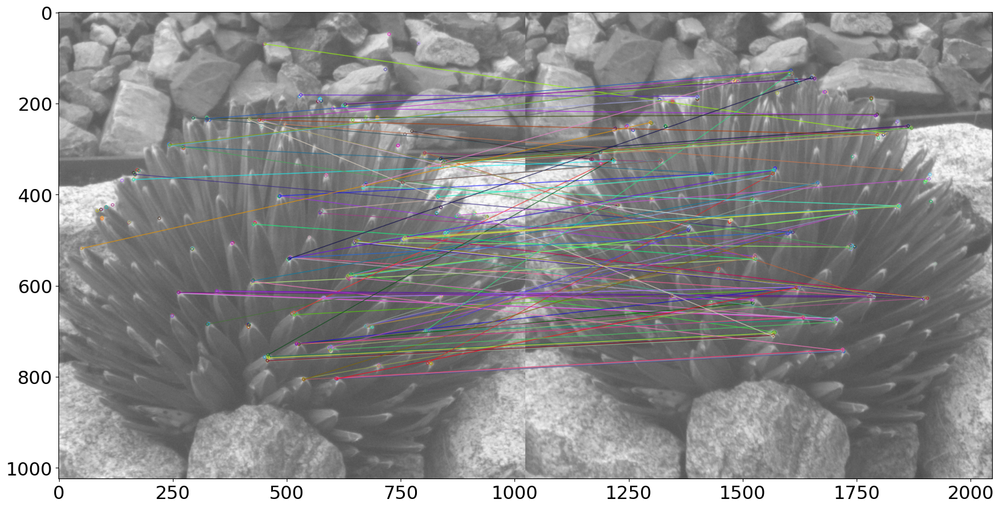

In [16]:

# Creating an ORB object
orb = cv2.ORB_create()

img1=gray[1250:2274,412:1436]
img2=gray2[1200:2224,512:1536]
# Finding the keypoints and descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Creating a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Matching the descriptors
matches = bf.match(des1, des2)

# Sorting the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Drawing the first 10 matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None)

# Showing the result
plt.imshow( img3)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

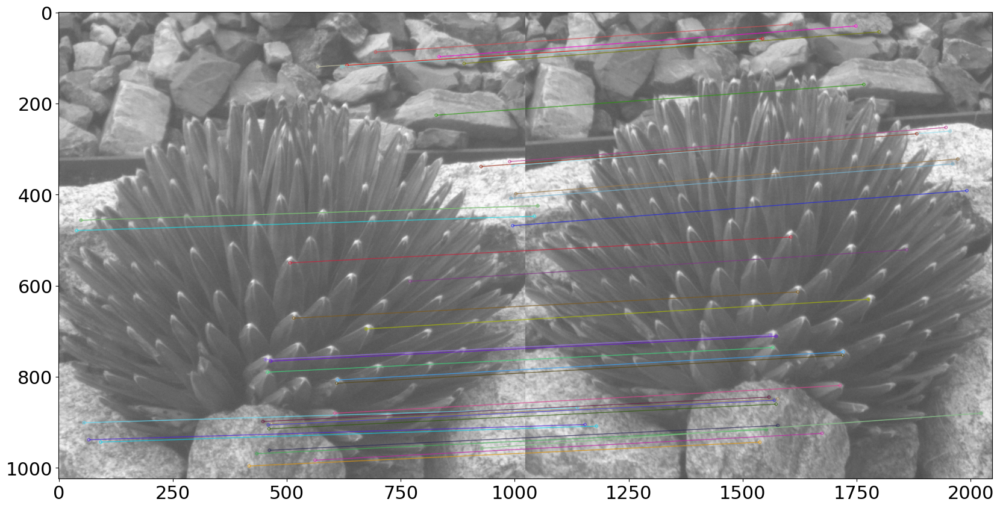

In [17]:


# Create a SIFT object
sift = cv2.SIFT_create()

# Detect and compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Create a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match the descriptors
matches = bf.match(des1, des2)

# Sort the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 10 matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:40], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the result
plt.imshow( img3)
plt.savefig('siftKeypointMatches.pdf')
#files.download('siftKeypointMatches.pdf')

In [18]:

# find homography from SIFT keypoints



# Define the FLANN matcher parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Create the FLANN matcher object
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Find the matches using KNN
matches = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test to filter the good matches
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Check if there are enough good matches
if len(good) > 10:
    # Extract the source and destination points from the good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Find the homography matrix using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Print the homography matrix
    print('Homography matrix:')
    print(H)
else:
    # Print an error message if not enough matches are found
    print('Not enough matches are found - {}/{}'.format(len(good), 10))

Homography matrix:
[[ 9.85362096e-01  2.04567601e-01 -1.28375486e+02]
 [-4.54381293e-02  9.94078549e-01 -2.90257134e+01]
 [-3.06963631e-06 -4.57130965e-06  1.00000000e+00]]


In [19]:
warpImage=cv2.warpPerspective(img1,H,(1024,1024))

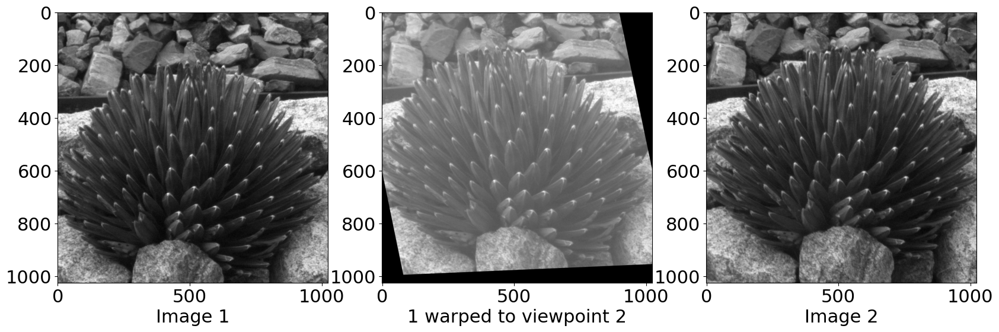

In [20]:
plt.subplot(1,3,1)
plt.imshow(img1, cmap='gray')
plt.xlabel('Image 1')
plt.subplot(1,3,2)
plt.imshow(warpImage,cmap='gray')
plt.xlabel('1 warped to viewpoint 2')
plt.subplot(1,3,3)
plt.imshow(img2, cmap='gray')
plt.xlabel('Image 2')
plt.savefig('warpedImage.pdf')
#files.download('warpedImage.pdf')

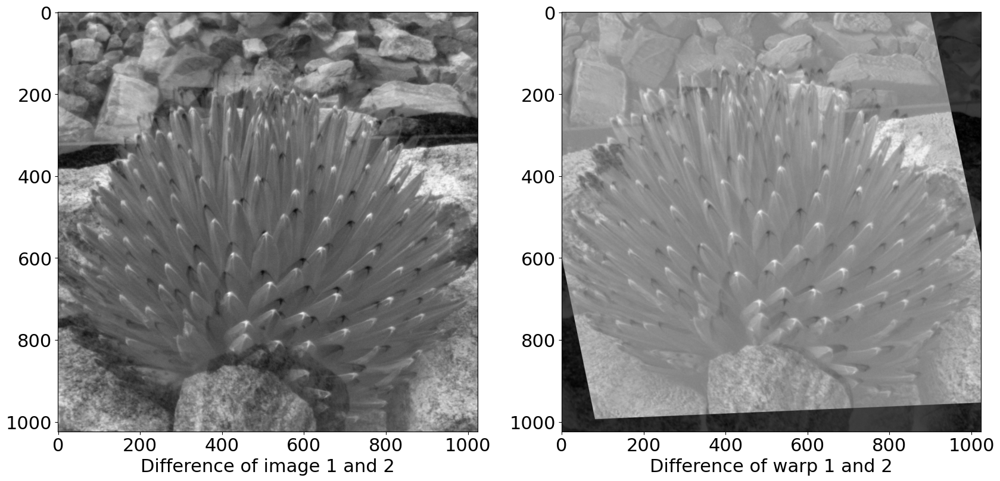

In [21]:
plt.subplot(1,2,1)
plt.imshow((2.*img1-img2),cmap='gray')
plt.xlabel('Difference of image 1 and 2')
plt.subplot(1,2,2)
plt.imshow((2.*warpImage-img2), cmap='gray')
plt.xlabel('Difference of warp 1 and 2')
plt.savefig('warpedImageDif.pdf')
#files.download('warpedImageDif.pdf')


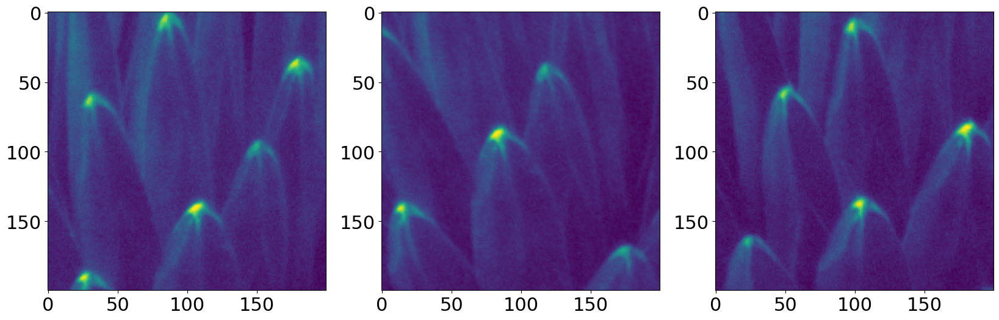

In [22]:
plt.subplot(1,3,1)
plt.imshow(img1[400:600,400:600])
plt.subplot(1,3,2)
plt.imshow(warpImage[400:600,400:600])
plt.subplot(1,3,3)
plt.imshow(img2[400:600,400:600])

## Planar Object

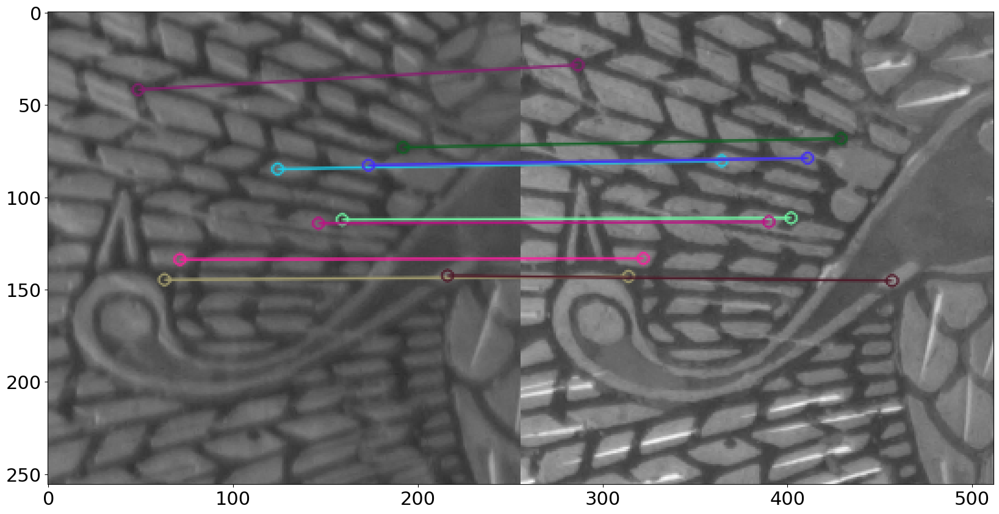

In [23]:
# Create a SIFT object
sift = cv2.SIFT_create()

# Detect and compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(p1, None)
kp2, des2 = sift.detectAndCompute(p2, None)

# Create a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match the descriptors
matches = bf.match(des1, des2)

# Sort the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 10 matches
img3 = cv2.drawMatches(p1, kp1, p2, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the result
plt.imshow( img3)
plt.savefig('peacockSift.pdf')
#files.download('peacockSift.pdf')

In [24]:
# Define the FLANN matcher parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Create the FLANN matcher object
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Find the matches using KNN
matches = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test to filter the good matches
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Check if there are enough good matches
if len(good) > 10:
    # Extract the source and destination points from the good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Find the homography matrix using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Print the homography matrix
    print('Homography matrix:')
    print(H)
else:
    # Print an error message if not enough matches are found
    print('Not enough matches are found - {}/{}'.format(len(good), 10))

Homography matrix:
[[ 9.97814363e-01  1.82492908e-01 -2.49806533e+01]
 [ 1.96724819e-02  1.22962258e+00 -2.28590061e+01]
 [-6.07877275e-06  5.71087326e-04  1.00000000e+00]]


In [25]:
warpImage=cv2.warpPerspective(p1,H,(256,256))

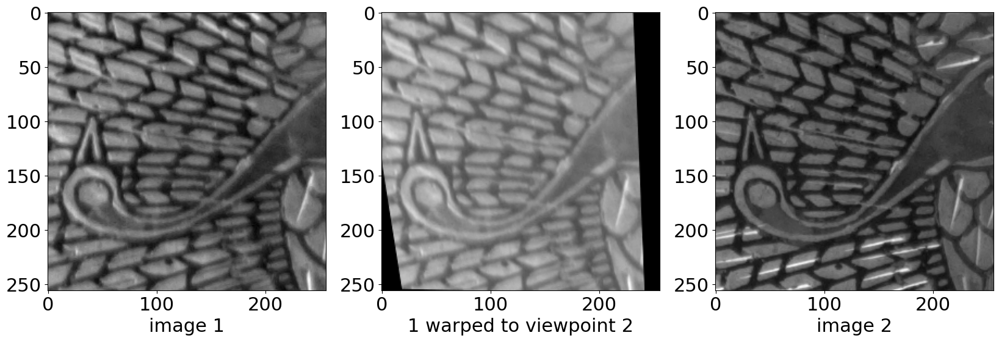

In [26]:
plt.subplot(1,3,1)
plt.imshow(p1, cmap='gray')
plt.xlabel('image 1')
plt.subplot(1,3,2)
plt.imshow(warpImage, cmap='gray')
plt.xlabel('1 warped to viewpoint 2')
plt.subplot(1,3,3)
plt.imshow(p2, cmap='gray')
plt.xlabel('image 2')
plt.savefig('peacockWarp.pdf')
#files.download('peacockWarp.pdf')


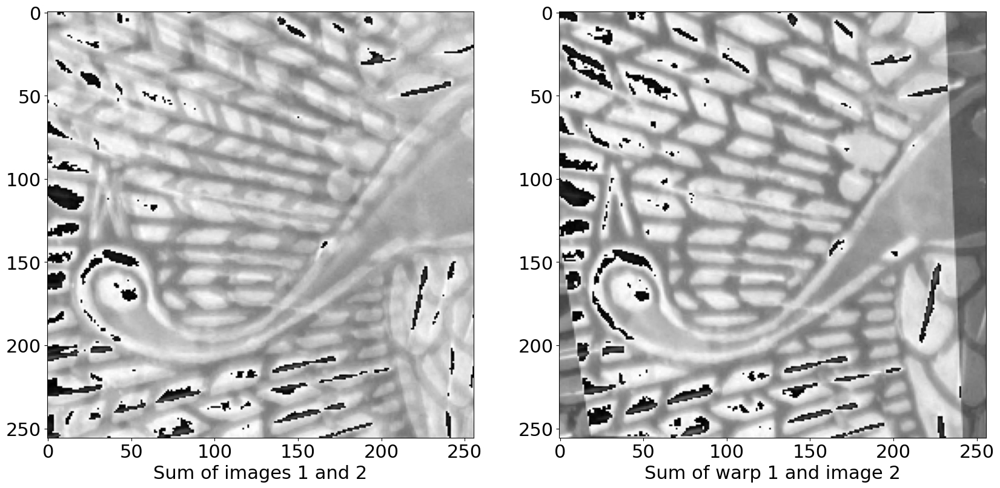

In [27]:

plt.subplot(1,2,1)
plt.imshow((p1+p2)/2., cmap='gray')
plt.xlabel('Sum of images 1 and 2')
plt.subplot(1,2,2)
plt.imshow((warpImage+p2)/2., cmap='gray')
plt.xlabel('Sum of warp 1 and image 2')
plt.savefig('peacockSum.pdf')
#files.download('peacockSum.pdf')